In [1]:
import sys, os, time
# %load_ext autoreload
# %autoreload 2
os.environ['FOUNDATION_RUN_MODE'] = 'jupyter'
os.environ['FOUNDATION_SAVE_DIR'] = '/is/ei/fleeb/workspace/chome/trained_nets'
os.environ['FOUNDATION_DATA_DIR'] = '/is/ei/fleeb/workspace/local_data'
# from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "all"
from IPython import display
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as distrib
import torch.multiprocessing as mp
import torchvision.models
import torchvision
from torch.utils.data import Dataset, DataLoader, TensorDataset
import gym
import numpy as np
%matplotlib notebook
# %matplotlib tk
import matplotlib.pyplot as plt
import imageio
import seaborn as sns
#plt.switch_backend('Qt5Agg') #('Qt5Agg')
import foundation as fd
from foundation import models
from foundation import util
from foundation import train
#from foundation.util import replicate, Cloner

from hybrid import get_model, get_data

np.set_printoptions(linewidth=120, suppress=True)

In [443]:
media_root = '/is/ei/fleeb/workspace/media/hybrid/new/3dshapes/pres'
# util.create_dir(media_root)
root = os.environ['FOUNDATION_SAVE_DIR']
names = [n for n in os.listdir(root) if 'wae' in n and '1205' in n and not 'test' in n]
for i, name in enumerate(names):
    print(i,name)

0 gan_191205-145831


In [444]:
idx = 0

# idx = None

if idx is not None: # load existing model args
    name = names[idx]
    path = os.path.join(root, name)
    A = None
    print('Using: {}'.format(name))
else: # create new model args
    path = None
    A = train.get_config('model')
    print('Using: blank')

Using: gan_191205-145831


In [445]:
A, (dataset, *other), model, ckpt = train.load(path=path, A=A, get_model=get_model, get_data=get_data, return_ckpt=True)
print(model)
print(model.optim)
print(model.scheduler)

Loaded /is/ei/fleeb/workspace/chome/trained_nets/gan_191205-145831/best.pth.tar
Set dataroot to: /is/ei/fleeb/workspace/local_data
Dataset 3dshapes moved to cuda
Dataset din=(3, 64, 64), dout=(3, 64, 64)
Model-type: wpp
Creating sub-component: encoder (type=conv)
din: (3, 64, 64)
in_shape is an alias for din
in_shape default: (3, 64, 64)
channels: [32, 32, 64, 64, 128]
latent_dim: 16
feature_dim: None
feature_dim default: None
nonlin: prelu
output_nonlin: None
output_nonlin default: None
downsampling: max
norm_type: instance
output_norm_type: None
output_norm_type default: None
fc: [256, 128]
hidden_fc is an alias for fc
hidden_fc default: [256, 128]
kernels: 3
strides: 2
factors: 1
optim_type: adam
lr: 0.001
weight_decay: 0
momentum: 0
beta1: 0.9
beta2: 0.999
Creating sub-component: generator (type=deconv)
dout: (3, 64, 64)
out_shape is an alias for dout
out_shape default: (3, 64, 64)
channels: [128, 64, 64, 32, 32]
latent_dim: 16
nonlin: prelu
output_nonlin: sigmoid
upsampling: bilin

In [446]:
records = ckpt['records']
'Trained on {:2.2f} M samples'.format(records['total_samples']['train']/1e6)

'Trained on 33.26 M samples'

In [447]:
A.dataset.batch_size = 9
img_W = 3
loader = train.get_loaders(dataset, batch_size=A.dataset.batch_size, num_workers=A.num_workers,
                            shuffle=True, drop_last=False, )
util.set_seed(0)
loader = iter(loader)

Using batched data loader


In [448]:
batch = next(loader)
# batch = next(loader)
batch = util.to(batch, A.device)

In [449]:
save_dir = os.path.join(media_root, name)
reverse_rows = False
grdlines = False
save_figs = True
if save_figs:
    util.create_dir(save_dir)

In [450]:
def show_nums(imgs, titles=None, H=None, W=None, figsize=(6,6)):
    if H is None and W is None:
        B = imgs.size(0)
        l = int(np.sqrt(B))
        assert l**2 == B, 'not right: {} {}'.format(l, B)
        H, W = l, l
    elif H is None:
        H = imgs.shape[0] // W
    elif W is None:
        W = imgs.shape[0] // H
    
    imgs = imgs.cpu().permute(0,2,3,1).squeeze().numpy()
    
    fig, axes = plt.subplots(H, W, figsize=figsize)
    
    if titles is None:
        titles = [None]*len(imgs)
    
    iH, iW = imgs.shape[1], imgs.shape[2]
    
    for ax, img, title in zip(axes.flat, imgs, titles):
        plt.sca(ax)
        if reverse_rows:
            img = img[::-1]
        plt.imshow(img)
        if grdlines:
            plt.plot([0,iW],[iH/2,iH/2],c='r',lw=.5,ls='--')
            plt.plot([iW/2,iW/2],[0,iH],c='r',lw=.5,ls='--')
            plt.xlim(0,iW)
            plt.ylim(0,iH)
        if title is not None:
            plt.xticks([])
            plt.yticks([])
            plt.title(title)
        else:
            plt.axis('off')
#     fig.tight_layout()
    return fig

In [451]:
# # args.dataset = '3dshapes'
# args.dataset = 'dsprites'

# datasets = get_data(args)

In [452]:
plt.close('all')

In [453]:
X, = batch
X.shape#, Y.shape

torch.Size([9, 3, 64, 64])

<IPython.core.display.Javascript object>


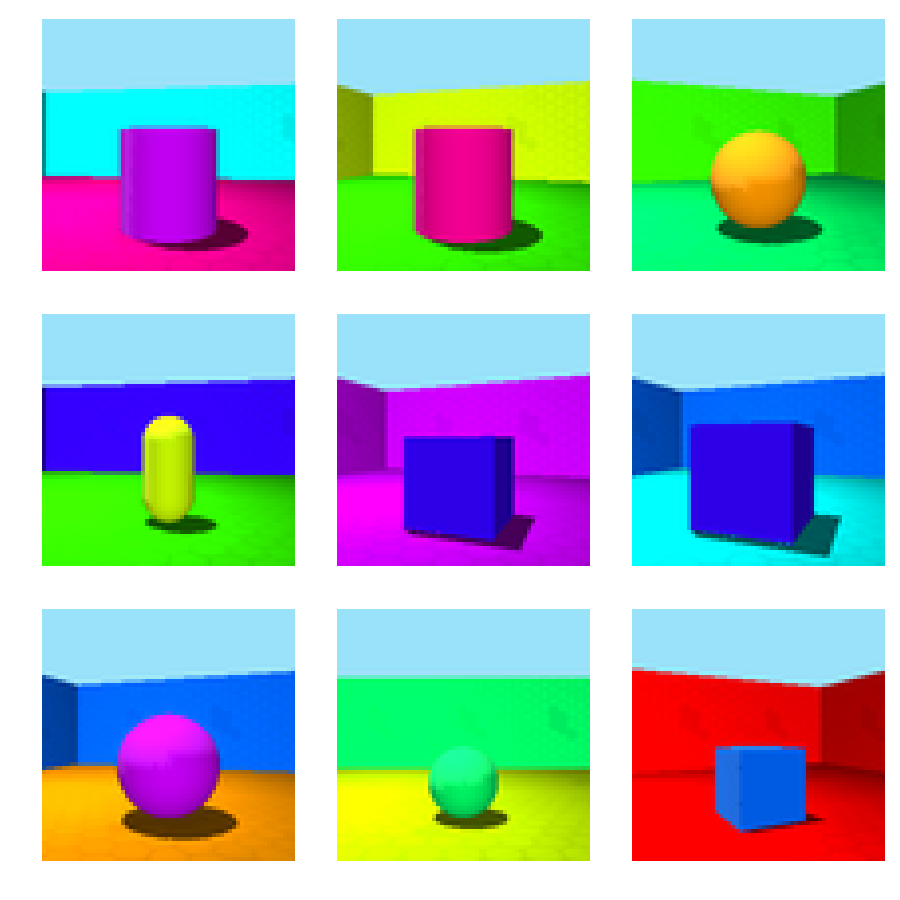

In [454]:
fig = show_nums(X, figsize=(9,9), H=img_W)
# fig.suptitle("originals", fontsize=14)
plt.tight_layout()
if save_figs:
    plt.savefig(os.path.join(save_dir,'originals.png'))

<IPython.core.display.Javascript object>


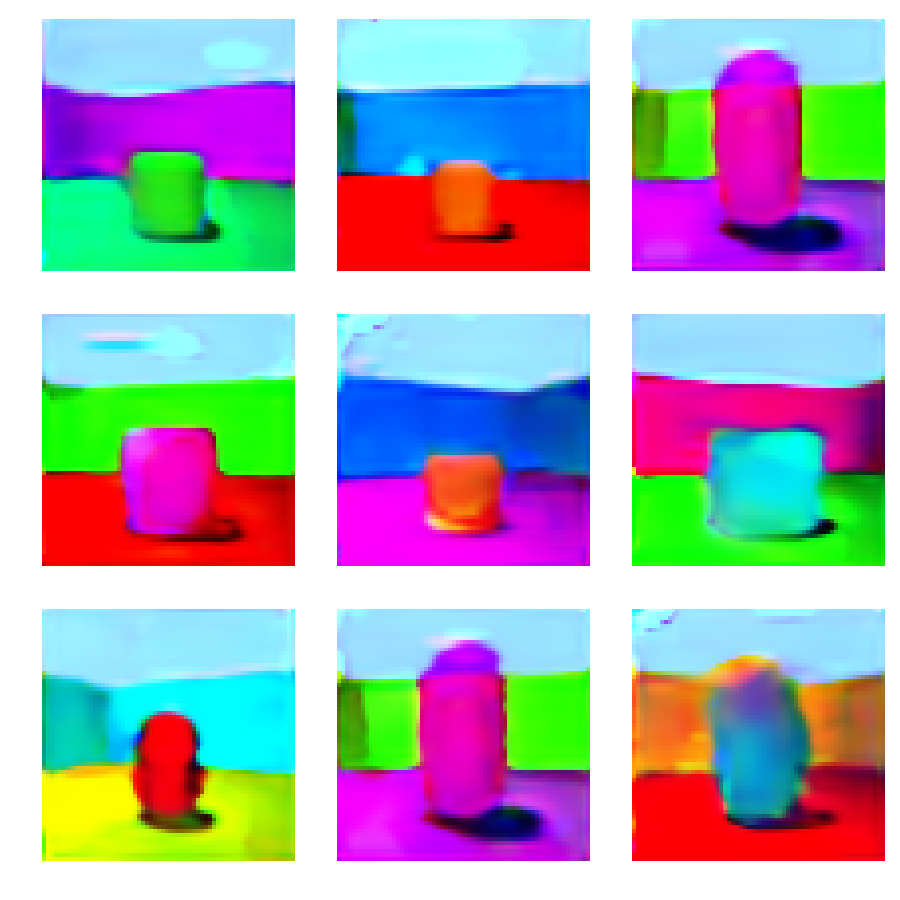

In [455]:
with torch.no_grad():
    
    if model.enc is None:
        q = model.sample_prior(X.size(0))
    else:
        q = model.encode(X)
    qdis = q
    qmle = q
    if isinstance(q, distrib.Distribution):
        q = q.rsample()
        qmle = qdis.loc
    rec = model.decode(q)
    vrec = model.disc(rec) if model.disc is not None else None
fig = show_nums(rec,figsize=(9,9),  W=img_W)#['{:4.0f}'.format(v.item()) for v in vrec])
# fig.suptitle("reconstructions" if model.enc is not None else 'generated', fontsize=14)
plt.tight_layout()
rec.shape#, q.shape
if save_figs:
    plt.savefig(os.path.join(save_dir,'recs.png' if model.enc is not None else 'gen.png'))

In [456]:
stats = qmle.min(0)[0], qmle.max(0)[0], qmle.mean(0), qmle.std(0)
stat_names = ['min', 'max', 'mean', 'std']
stats

(tensor([-1.1451, -1.4977, -3.1298, -1.3909, -1.4032, -1.4429, -2.1226, -1.2973,
         -1.6148, -0.9264, -1.6711, -1.5517, -0.9021, -0.8373, -1.9107, -1.0823],
        device='cuda:0'),
 tensor([1.8969, 1.2169, 1.4353, 2.0775, 0.8971, 1.4448, 1.5446, 1.5150, 2.1437,
         0.4532, 1.8969, 2.2655, 0.6587, 1.0252, 1.3506, 1.1820],
        device='cuda:0'),
 tensor([-1.6775e-01, -1.0214e-01, -4.8416e-01, -3.1023e-02, -3.4357e-01,
         -2.0078e-01, -4.2053e-04,  1.6362e-02, -1.3273e-01, -2.5167e-01,
          5.7829e-01,  3.6004e-01,  1.0539e-01, -1.1458e-02,  1.4299e-01,
         -4.1722e-01], device='cuda:0'),
 tensor([0.8676, 0.8794, 1.6235, 1.1046, 0.6714, 1.0645, 1.0561, 0.8749, 1.0655,
         0.4842, 1.1837, 1.2193, 0.4531, 0.5325, 1.1747, 0.6941],
        device='cuda:0'))

<IPython.core.display.Javascript object>


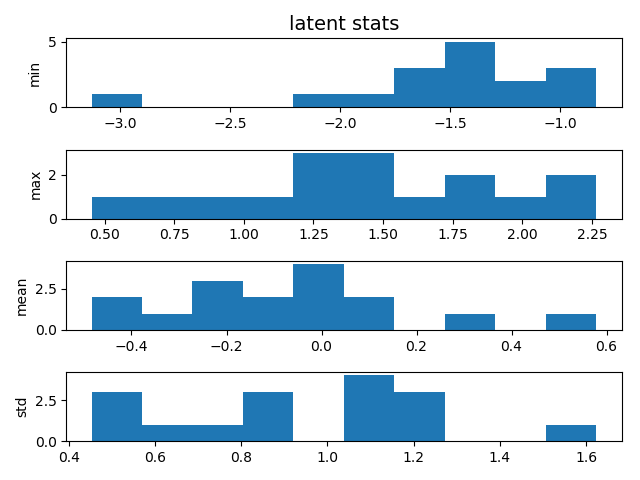

In [457]:
fig, axs = plt.subplots(4)
plt.sca(axs[0])
plt.title("latent stats", fontsize=14)
for ax, stat, sname in zip(axs, stats, stat_names):
    plt.sca(ax)
    plt.ylabel(sname)
    plt.hist(stat.cpu().numpy())
plt.tight_layout()
if save_figs:
    plt.savefig(os.path.join(save_dir,'stats.png'))
pass

In [458]:
# if isinstance(qdis, distrib.Distribution):
#     mu, sigma = qdis.loc, qdis.scale
#     stats = sigma.min(0)[0], sigma.max(0)[0], sigma.mean(0), sigma.std(0)
    
#     fig, axs = plt.subplots(4)
#     for ax, stat, sname in zip(axs, stats, stat_names):
#         plt.sca(ax)
#         plt.ylabel(sname)
#         plt.hist(stat.cpu().numpy())
#     fig.suptitle("scales", fontsize=14)
#     plt.tight_layout()

<IPython.core.display.Javascript object>


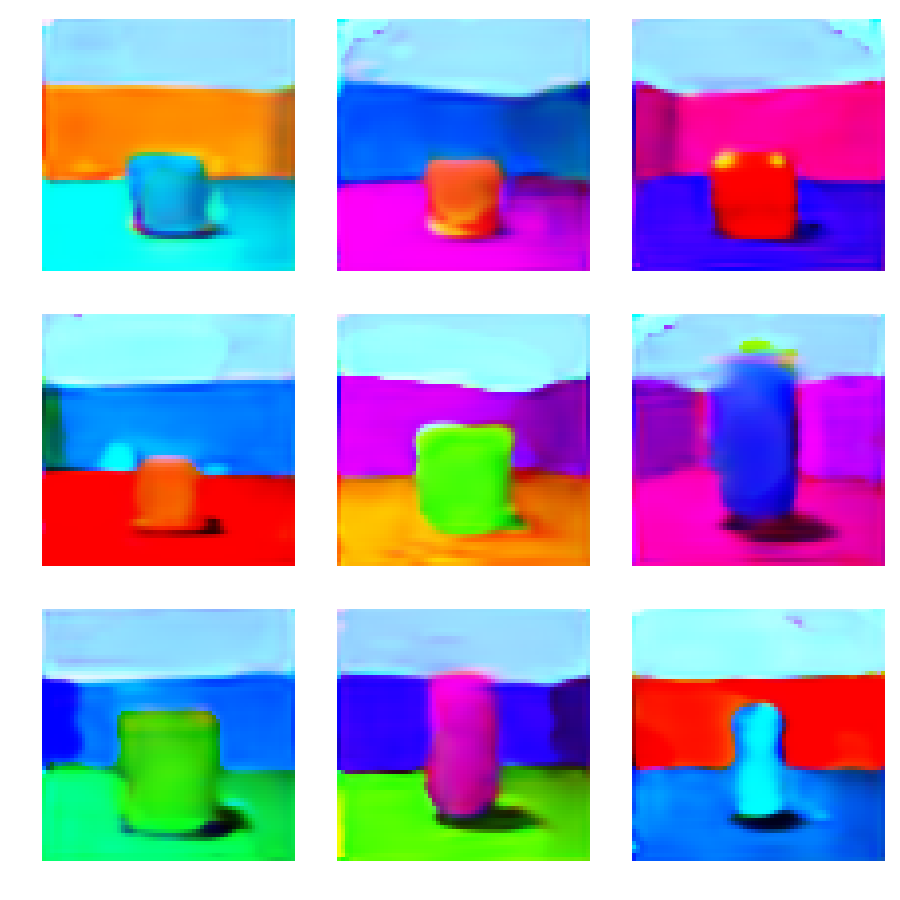

(torch.Size([9, 16]), torch.Size([9, 3, 64, 64]))

In [459]:
with torch.no_grad():
    mix = util.shuffle_dim(q)
#     try:
#         hyb = model.hybridize(qdis)
#     except NotImplementedError:
#         model.splits = model.latent_dim
#         hyb = Hybrid_Generator.hybridize(model, qdis)
    hygen = model.decode(mix)
    vhyb = model.disc(hygen) if model.disc is not None else None
fig = show_nums(hygen,figsize=(9,9),W=img_W)#, ['{:4.0f}'.format(v.item()) for v in vhyb])
# fig.suptitle("hybrid", fontsize=14)
plt.tight_layout()
if save_figs:
    plt.savefig(os.path.join(save_dir,'hybrids.png'))
mix.shape, hygen.shape

<IPython.core.display.Javascript object>


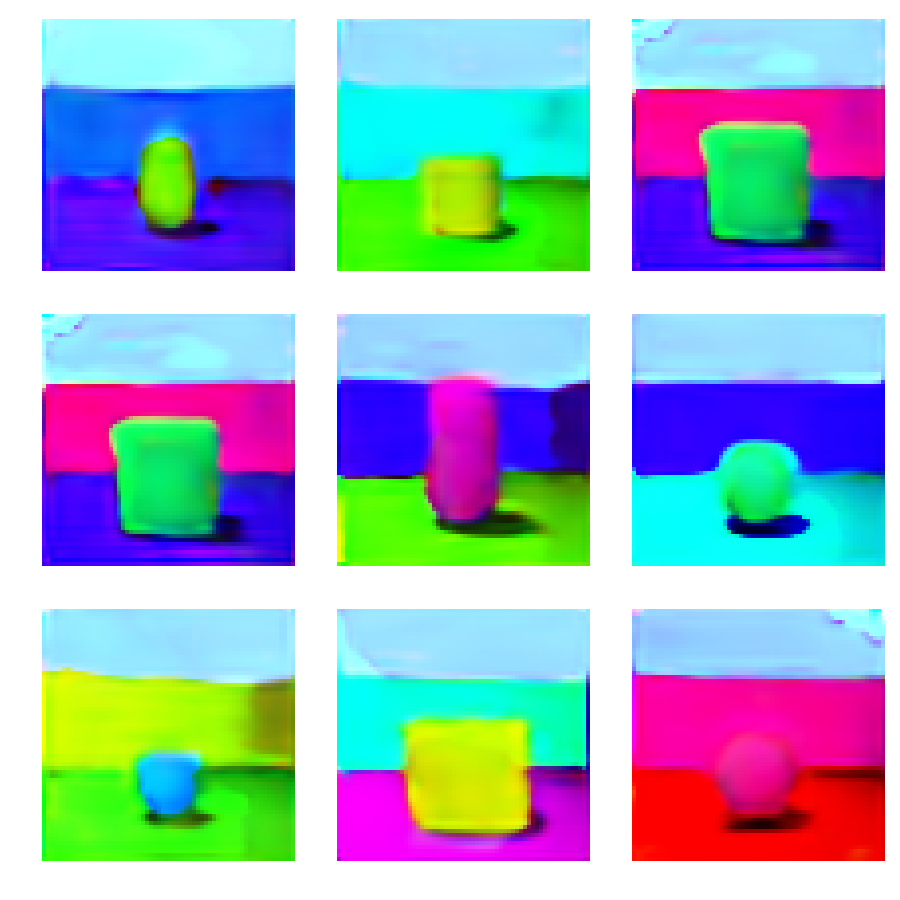

In [460]:
with torch.no_grad():
    gen = model.generate(X.size(0))
fig = show_nums(gen,figsize=(9,9), W=img_W )#['{:4.0f}'.format(v.item()) for v in vrec])
# fig.suptitle("generated", fontsize=14)
plt.tight_layout()
if save_figs:
    plt.savefig(os.path.join(save_dir,'gen.png'))
pass

In [461]:
# plt.close('all')

In [462]:
# # dim = 3
# idx = 1

# plt.figure()
# plt.imshow(rec[idx,0].cpu().numpy())
# plt.axis('off')
# pass

In [463]:
latent_dim = A.model.latent_dim
latent_dim

16

In [464]:
q.shape

torch.Size([9, 16])

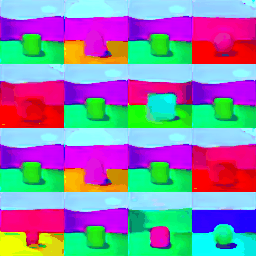

In [465]:

rows = 4
steps = 60
bounds = -2,2
# bounds = None
dlayout = rows, latent_dim//rows
outs = []

all_diffs = []
inds = [0, 2, 3]
inds = np.arange(len(q))
save_inds = [0, 1, 2, 3]

for idx in inds:

    walks = []
    for dim in range(latent_dim):

        dev = q[:,dim].std()
        if bounds is None:
            deltas = torch.linspace(q[:,dim].min(), q[:,dim].max(), steps)
        else:
            deltas = torch.linspace(bounds[0],bounds[1], steps)
        vecs = torch.stack([q[idx]]*steps)
        vecs[:,dim] = deltas

        with torch.no_grad():
            walks.append(model.decode(vecs).cpu())

    walks = torch.stack(walks,1)
    chn = walks.shape[2]

    dsteps = 10
    diffs = (walks[dsteps:] - walks[:-dsteps]).abs()#.view(steps-dsteps, latent_dim, chn, 64*64)
#     diffs /= (walks[dsteps:]).abs()
    #diffs = diffs.clamp(min=1e-10,max=1).abs()
    diffs = diffs.view(steps-dsteps, latent_dim, chn* 64*64).mean(-1)
#     diffs = 1 - diffs.mean(-1)
#     print(diffs.shape)
#     diffs *= 2
    all_diffs.append(diffs.mean(0))
#     print(all_diffs[-1])

    if save_figs and idx in save_inds:
        
        walks_full = walks.view(steps, dlayout[0], dlayout[1], chn, 64, 64).permute(0,1,4,2,5,3).contiguous().view(steps,64*dlayout[0],64*dlayout[1],chn).squeeze()
        images = []
        for img in walks_full.cpu().numpy():
            images.append((img*255).astype(np.uint8))
        imageio.mimsave(os.path.join(save_dir, 'walks-idx{}.gif'.format(idx,dim)), images)

        with open(os.path.join(save_dir, 'walks-idx{}.gif'.format(idx,dim)),'rb') as f:
            outs.append(display.Image(data=f.read(), format='gif'))
        del walks_full
all_diffs = torch.stack(all_diffs)
outs[0]

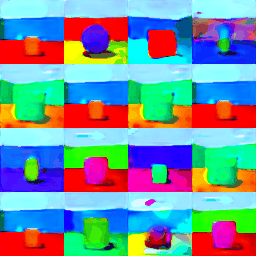

In [466]:
outs[1]

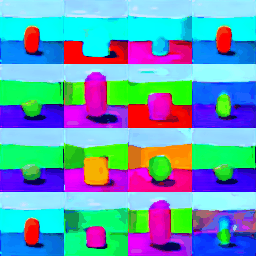

In [467]:
outs[2]

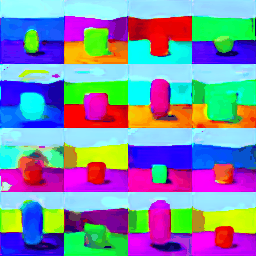

In [468]:
outs[3]

<IPython.core.display.Javascript object>


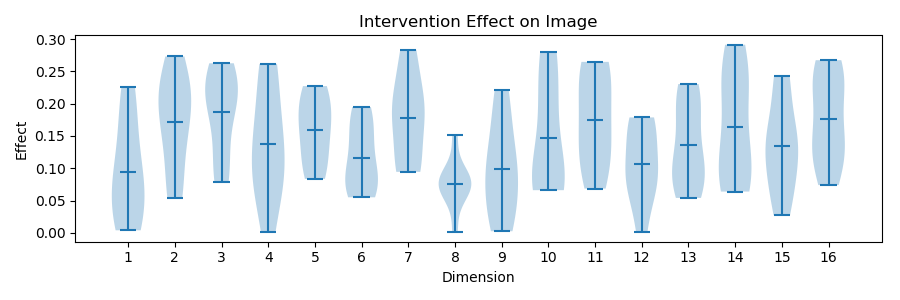

In [469]:
# violin plot of image effects
vals = all_diffs.cpu().numpy()
Xl = np.arange(vals.shape[-1])
fig, ax = plt.subplots(figsize=(9,3))
plt.violinplot(vals, Xl, points=200, widths=0.7,
                      showmeans=True, showextrema=True, showmedians=False)
plt.xticks(Xl, map(str, Xl+1))
plt.title('Intervention Effect on Image')
plt.xlabel('Dimension')
plt.ylabel('Effect')
plt.tight_layout()
if save_figs:
    plt.savefig(os.path.join(save_dir,'effect.png'))
pass